In [1]:
import sys
import os
# go to upper diretory
sys.path.append(os.path.abspath('./../../../'))
import csv
import glob
import librosa
import librosa.display
import numpy as np
import tensorflow as tf
import pickle
from sklearn import metrics
import noisereduce as nr
import matplotlib.pyplot as plt
from tqdm import tqdm
from Audio_Sentiment_Analysis.utils.Configuration import Configuration
from scipy.stats import skew, kurtosis
from librosa import display
import warnings
warnings.filterwarnings('ignore')
from IPython.display import display
from Audio_Sentiment_Analysis.utils.vscode_audio import Audio
import pandas as pd
import time
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier as RandomForest
from tabulate import tabulate
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

AUTOTUNE = tf.data.AUTOTUNE
AUDIO_DIR = f"{os.path.abspath('./../../../')}/IEMOCAP_Dataset"
PREPROCESSED_EXTRACTED_FEATURES_FILE = 'preprocessed_extracted_features_iemocap.csv'
PREPROCESSED_ALL_EXTRACTED_FEATURES_FILE = 'all_preprocessed_extracted_features_iemocap.csv'
EXTRACTED_FEATURES_FILE = 'extracted_features_iemocap.csv'
ALL_EXTRACTED_FEATURES_FILE = 'all_extracted_features_iemocap.csv'
RAW_AUDIO_FILES = 'raw_audio_files.csv'
AUDIO_SPECTROGRAMS_DIR = './../data/spectrograms/'
AUDIO_MFCCS_DIR = './../data/mfccs/'
AUDIO_MEL_SPECTROGRAMS_DIR = './../data/mel_spectrograms/'
AUDIO_MEL_SPECTROGRAM_IMAGES_DIR = './../data/mel_spectrogram_images/'
AUDIO_MEL_SPECTROGRAM_IMAGES_DIR_2 = './../data/mel_spectrogram_images_2/'

CONFIG_FILE = f"{os.path.abspath('./../../../')}/Audio_Sentiment_Analysis/iemocap/config.json"
config = Configuration.load_json(CONFIG_FILE)
plt.rcParams['figure.dpi'] = 300

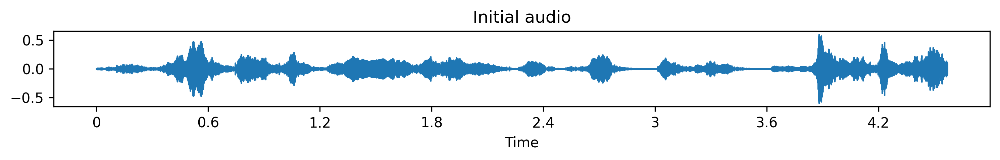

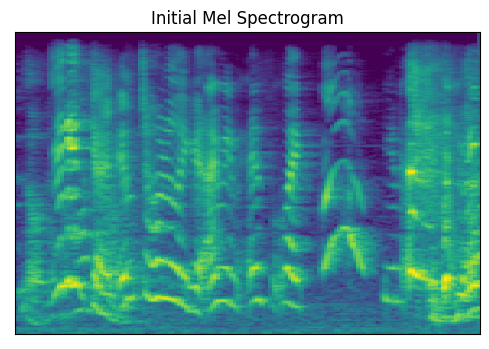

In [2]:
path = r'C:\Users\Chico\Desktop\VADER\IEMOCAP_Dataset\Session2\sentences\wav\Ses02F_impro03\Ses02F_impro03_F014.wav'

# 1. Load the audio file into an 'AudioSegment' object, and extract the sample rate. 
#    'x' is an array of samples that is only relevant for visualization at this part.

x, sr = librosa.load(path, sr = None)

plt.figure(figsize=(12,1), dpi=300)
librosa.display.waveshow(x, sr)
plt.title('Initial audio')
plt.show()

fig = plt.figure(dpi=100)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y=x, sr=sr, n_mels=256, n_fft=2048, hop_length=512), ref=np.max), cmap="viridis")
fig.savefig('test-mel.png', bbox_inches='tight', pad_inches=0, dpi=100)
plt.title('Initial Mel Spectrogram')
plt.show()

display(Audio(x, sr))

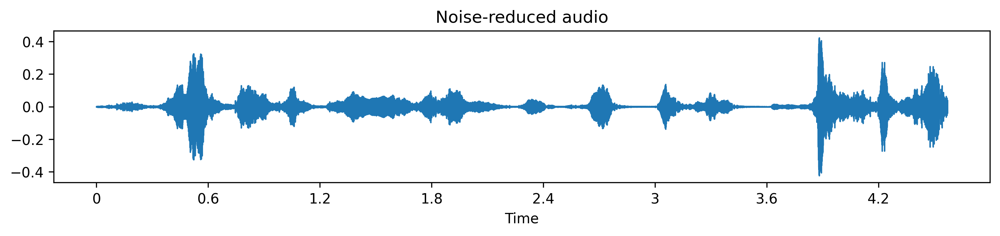

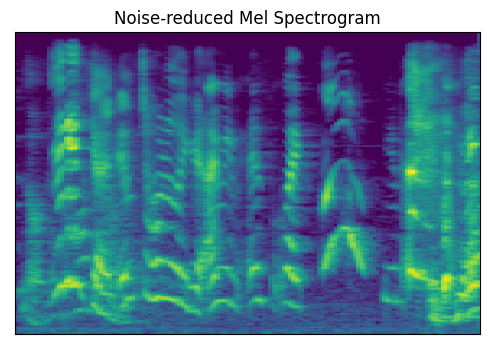

In [4]:
# 2. Noise reduction

nr_x = nr.reduce_noise(y=x, sr=sr, n_fft=2048, hop_length=512, prop_decrease=.75, time_constant_s=1)

plt.figure(figsize=(12,2), dpi=300)
librosa.display.waveshow(nr_x, sr)
plt.title('Noise-reduced audio')
plt.show()

fig = plt.figure(dpi=100)
librosa.display.specshow(librosa.power_to_db(librosa.feature.melspectrogram(y=nr_x, sr=sr, n_mels=256, n_fft=2048, hop_length=512), ref=np.max), cmap="viridis")
fig.savefig('test-mel-nr.png', bbox_inches='tight', pad_inches=0, dpi=100)
plt.title('Noise-reduced Mel Spectrogram')
plt.show()

display(Audio(nr_x, sr))

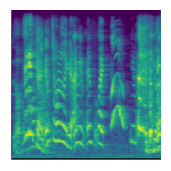

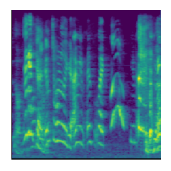

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


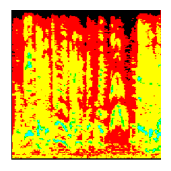

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


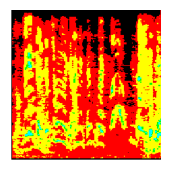

In [5]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.resnet50 import preprocess_input

def tf_load_image(filename, preprocess=False):
    fig = plt.figure(figsize=(2,2), dpi=100)
    ax = fig.add_subplot()
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    img_size = 224
    img = load_img(filename, target_size=(img_size, img_size))
    if preprocess:
        img = img_to_array(img)
        img = preprocess_input(img)
    plt.imshow(img)
    plt.show()

tf_load_image('test-mel.png')
tf_load_image('test-mel-nr.png')
tf_load_image('test-mel.png', preprocess=True)
tf_load_image('test-mel-nr.png', preprocess=True)

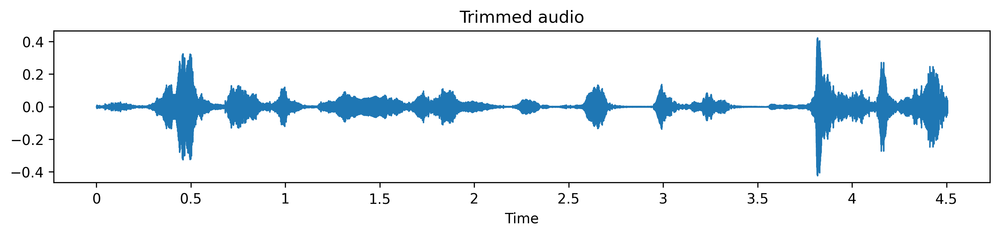

0.04643990929705222


In [6]:
# 3. Trim silence in the beginning and end.
# 30 decibels and lower are considered as silence
xt, _ = librosa.effects.trim(nr_x, top_db=30)

plt.figure(figsize=(12,2))
librosa.display.waveshow(xt, sr)
plt.title('Trimmed audio')
plt.show()

print(librosa.get_duration(nr_x) - librosa.get_duration(xt))

display(Audio(xt, sr))

Original Duration: 4.5699375 seconds


Preprocessed Duration: 4.5059375 seconds


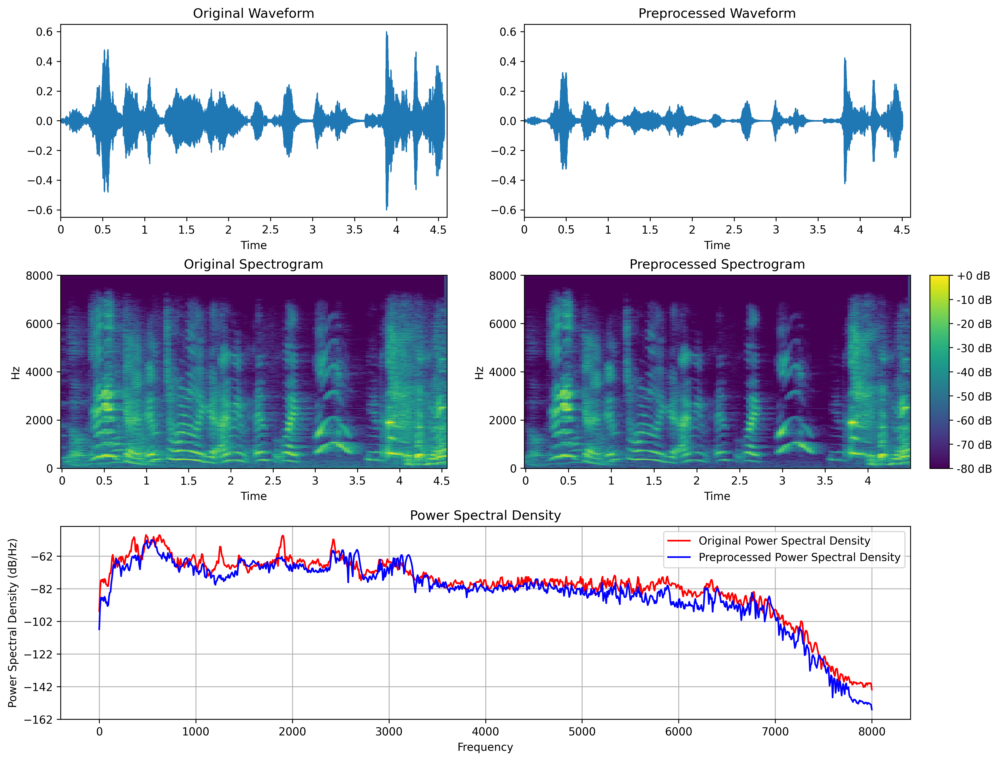

In [94]:
def preprocess_audio(y, sr):
    y = nr.reduce_noise(y=y, sr=sr, n_fft=2048, hop_length=512, prop_decrease=.75, time_constant_s=1, n_jobs=-1)
    y, _ = librosa.effects.trim(y, top_db=30)
    return y

path = r'C:\Users\Chico\Desktop\VADER\IEMOCAP_Dataset\Session2\sentences\wav\Ses02F_impro03\Ses02F_impro03_F014.wav'

x, sr = librosa.load(path, sr = None)
xp = preprocess_audio(x, sr)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

print(f"Original Duration: {librosa.get_duration(x, sr)} seconds")
display(Audio(x, sr))

print(f"Preprocessed Duration: {librosa.get_duration(xp, sr)} seconds")
display(Audio(xp, sr))

fig = plt.figure(constrained_layout=True, figsize=(14, 16), dpi=300)

grid = plt.GridSpec(4, 2, wspace=0.2, hspace=0.3)

ax = plt.subplot(grid[0, 0])
librosa.display.waveshow(x, sr, ax=ax)
plt.xlim(0, 4.6)
plt.ylim(-0.65, 0.65)
plt.title('Original Waveform')

ax = plt.subplot(grid[0, 1])
librosa.display.waveshow(xp, sr, ax=ax)
plt.xlim(0, 4.6)
plt.ylim(-0.65, 0.65)
plt.title('Preprocessed Waveform')

ax = plt.subplot(grid[1, 0])
spec = np.abs(librosa.stft(x,  n_fft=2048))
img = librosa.display.specshow(librosa.amplitude_to_db(spec, ref=np.max), sr=sr, ax=ax, cmap="viridis", y_axis='linear', x_axis='time')
plt.title('Original Spectrogram')


axins = inset_axes(ax, # here using axis of the lowest plot
               width="5%",  # width = 5% of parent_bbox width
               height="200%",  # height : 340% good for a (4x4) Grid
               loc='lower right',
               bbox_to_anchor=(1.3, 0, 1, 0.5),
               bbox_transform=ax.transAxes,
               borderpad=0,
               )

fig.colorbar(img, cax=axins, format='%+2.0f dB')

ax = plt.subplot(grid[1, 1])
spec = np.abs(librosa.stft(xp,  n_fft=2048))
librosa.display.specshow(librosa.amplitude_to_db(spec, ref=np.max), sr=sr, ax=ax, cmap="viridis", y_axis='linear', x_axis='time')
plt.title('Preprocessed Spectrogram')

ax = plt.subplot(grid[2, :])
plt.psd(x, NFFT=2048, Fs=sr, color="red", label='Original Power Spectral Density', axes=ax)
plt.psd(xp, NFFT=2048, Fs=sr, color="blue", label='Preprocessed Power Spectral Density', axes=ax)
plt.title("Power Spectral Density")

plt.legend()
plt.show()

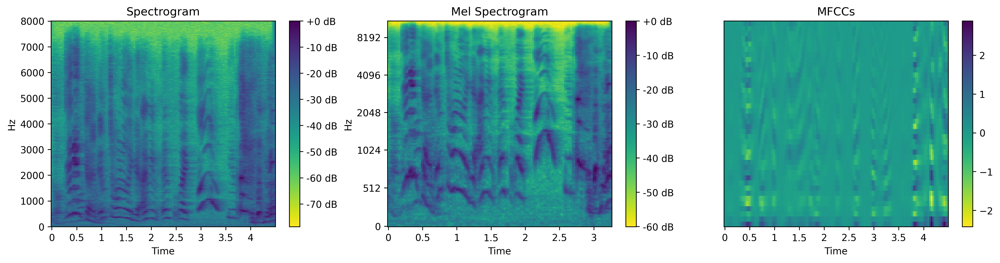

In [3]:
def preprocess_audio(y, sr):
    y = nr.reduce_noise(y=y, sr=sr, n_fft=2048, hop_length=512, prop_decrease=.75, time_constant_s=1)
    y, _ = librosa.effects.trim(y, top_db=30)
    return y

path = r'C:\Users\Chico\Desktop\VADER\IEMOCAP_Dataset\Session2\sentences\wav\Ses02F_impro03\Ses02F_impro03_F014.wav'

x, sr = librosa.load(path, sr = None)
xp = preprocess_audio(x, sr)

fig = plt.figure(constrained_layout=True, figsize=(18, 4), dpi=300)

grid = plt.GridSpec(1, 3, wspace=0.2, hspace=0.2)

ax = plt.subplot(grid[0, 0])
# ax.axes.get_xaxis().set_visible(False)
# ax.axes.get_yaxis().set_visible(False)
# ax.set_frame_on(False)
spec = np.abs(librosa.stft(xp, n_fft=2048))
img = librosa.display.specshow(librosa.power_to_db(spec, ref=np.max), sr=sr, ax=ax, cmap="viridis_r", y_axis='linear', x_axis='time')
plt.colorbar(img, ax=ax, format='%+2.0f dB')
plt.title('Spectrogram')

ax = plt.subplot(grid[0, 1])
# ax.axes.get_xaxis().set_visible(False)
# ax.axes.get_yaxis().set_visible(False)
# ax.set_frame_on(False)
mel_spec = librosa.feature.melspectrogram(S=spec, n_mels=256)
img = librosa.display.specshow(librosa.power_to_db(mel_spec, ref=np.max), cmap="viridis_r", ax=ax, y_axis='mel', x_axis='time')
plt.colorbar(img, ax=ax, format='%+2.0f dB')
plt.title('Mel Spectrogram')

ax = plt.subplot(grid[0, 2])
# ax.axes.get_xaxis().set_visible(False)
# ax.axes.get_yaxis().set_visible(False)
# ax.set_frame_on(False)
mfcc = librosa.feature.mfcc(S=mel_spec, n_mfcc=40)
img = librosa.display.specshow(mfcc, sr=sr, ax=ax, cmap="viridis_r", x_axis='time')
plt.colorbar(img, ax=ax)
plt.title('MFCCs')
plt.show()

In [8]:
def get_metrics(y_labels, y_pred, folds_size, train_times, prediction_times, draw_corr_matrix=True):
    accs = []
    i = 0
    for f_i in range(5):
      acc = round(metrics.accuracy_score(
          y_labels[i:i+folds_size[f_i]], y_pred[i:i+folds_size[f_i]]) * 100, 2)
      print(f"Accuracy for fold {f_i}: {acc}%")
      accs.append(acc)
      i += folds_size[f_i]

    table = [
        ["Accuracy",
            f"{round(metrics.accuracy_score(y_labels, y_pred) * 100, 2)}+-{round(np.std(accs), 2)}"],
        ["F1 score macro", round(metrics.f1_score(
            y_labels, y_pred, average='macro') * 100, 2)],
        ["Precision", round(metrics.precision_score(
            y_labels, y_pred, average='macro') * 100, 2)],
        ["Recall", round(metrics.recall_score(
            y_labels, y_pred, average='macro') * 100, 2)],
        ["Matthews corrcoef", round(
            metrics.matthews_corrcoef(y_labels, y_pred), 3)],
        ["Training Time", f"{round(np.sum(train_times), 2)}+-{round(np.std(train_times), 2)}"],
        ["Prediction Time", f"{round(np.sum(prediction_times), 2)}+-{round(np.std(prediction_times), 2)}"],
    ]
    print()
    print(tabulate(table, headers=["Metric", "Value"]))
    print()
    print(metrics.classification_report(y_labels, y_pred))

    if draw_corr_matrix:
        ticks = ['0 - angry', '1 - happy', '2 - sad', '3 - neutral']
        cm = metrics.confusion_matrix(y_labels, y_pred, normalize='all')
        plt.figure(figsize=(6, 6))
        sns.heatmap(cm, annot=True, fmt='.2f', xticklabels=ticks, yticklabels=ticks)
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Emotion Label")
        plt.ylabel("Real Emotion Label")
        plt.yticks(rotation=0)
        plt.show()


In [5]:
def categorical_cross_validation(get_new_model, cv=5, draw_corr_matrix=True):
    train_times = []
    prediction_times = []
    folds_size = []

    kfold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=1)
    
    X = df.iloc[:,9:]
    y = df.iloc[:,4:5]
    all_y_pred = []
    all_y_labels = []

    fold_no = 1
    for train, test in kfold.split(X, y):
        model = get_new_model()
        # scaler = MinMaxScaler((-1, 1))
        
        X_train, X_test = X.iloc[train], X.iloc[test]
        y_train, y_test = y.iloc[train], y.iloc[test]

        # X_train = scaler.fit_transform(X_train)
        # X_test = scaler.transform(X_test)

        folds_size.append(len(y_test))

        start_time = time.time()
        model.fit(X_train, y_train.values.ravel())
        train_times.append(time.time() - start_time)

        start_time = time.time()
        y_pred = model.predict(X_test)
        prediction_times.append(time.time() - start_time)

        all_y_pred.extend(y_pred)
        all_y_labels.extend(y_test.values.ravel())

        fold_no = fold_no + 1

    get_metrics(all_y_labels, all_y_pred, folds_size, train_times, prediction_times, draw_corr_matrix)

In [6]:
def get_new_model():
    return RandomForest(n_estimators=2000, n_jobs=-1, random_state=0, max_features=10)

In [7]:
df = pd.read_csv(EXTRACTED_FEATURES_FILE)
print(f"Number of Audio Files: {df.shape[0]}")
df = df.sort_values(['Emotion_Id', 'Gender'], ascending=(True, True))
df = df.set_index('File')
print(f"Number of Features: {len(df.iloc[:,8:].columns)}")
df = df[df['Emotion'].isin({'angry', 'neutral', 'sad', 'happy', 'excited'})]
df.loc[df['Emotion'] == 'excited', 'Emotion'] = 'happy'
df.loc[df['Emotion_Id'] == 5, 'Emotion_Id'] = 1
categorical_cross_validation(get_new_model)


Number of Audio Files: 5531
Number of Features: 327
Accuracy for fold 0: 63.32%
Accuracy for fold 1: 61.57%
Accuracy for fold 2: 62.39%
Accuracy for fold 3: 61.21%
Accuracy for fold 4: 61.93%

Metric             Value
-----------------  -----------
Accuracy           62.09+-0.73
F1 score macro     62.77
Precision          64.13
Recall             62.27
Matthews corrcoef  0.487
Training Time      48.42+-0.2
Prediction Time    4.45+-0.01

              precision    recall  f1-score   support

           0       0.74      0.59      0.66      1103
           1       0.60      0.53      0.57      1636
           2       0.66      0.68      0.67      1084
           3       0.56      0.69      0.62      1708

    accuracy                           0.62      5531
   macro avg       0.64      0.62      0.63      5531
weighted avg       0.63      0.62      0.62      5531



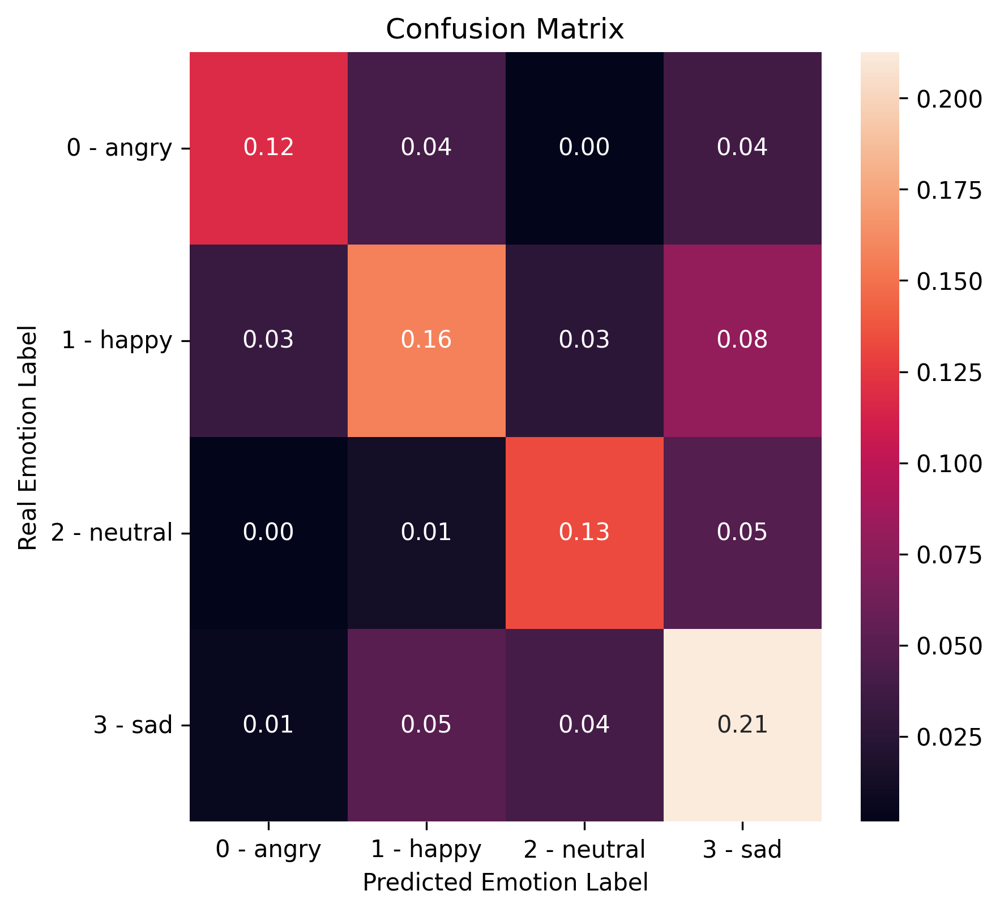

In [ ]:
df = pd.read_csv(ALL_EXTRACTED_FEATURES_FILE)
print(f"Number of Audio Files: {df.shape[0]}")
df = df.sort_values(['Emotion_Id', 'Gender'], ascending = (True, True))
df = df.set_index('File')
print(f"Number of Features: {len(df.iloc[:,8:].columns)}")
df = df[df['Emotion'].isin({'angry', 'neutral', 'sad', 'happy', 'excited'})]
df.loc[df['Emotion'] == 'excited', 'Emotion'] = 'happy'
df.loc[df['Emotion_Id'] == 5, 'Emotion_Id'] = 1
categorical_cross_validation(get_new_model)

Number of Audio Files: 5531
Number of Features: 33
Accuracy for fold 0: 60.89%
Accuracy for fold 1: 60.22%
Accuracy for fold 2: 59.49%
Accuracy for fold 3: 59.49%
Accuracy for fold 4: 58.77%

Metric             Value
-----------------  -----------
Accuracy           59.77+-0.72
F1 score macro     60.43
Precision          60.97
Recall             60.3
Matthews corrcoef  0.456
Training Time      52.93+-0.19
Prediction Time    4.59+-0.02

              precision    recall  f1-score   support

       angry       0.66      0.61      0.63      1103
       happy       0.57      0.49      0.53      1636
     neutral       0.56      0.66      0.60      1708
         sad       0.66      0.66      0.66      1084

    accuracy                           0.60      5531
   macro avg       0.61      0.60      0.60      5531
weighted avg       0.60      0.60      0.60      5531



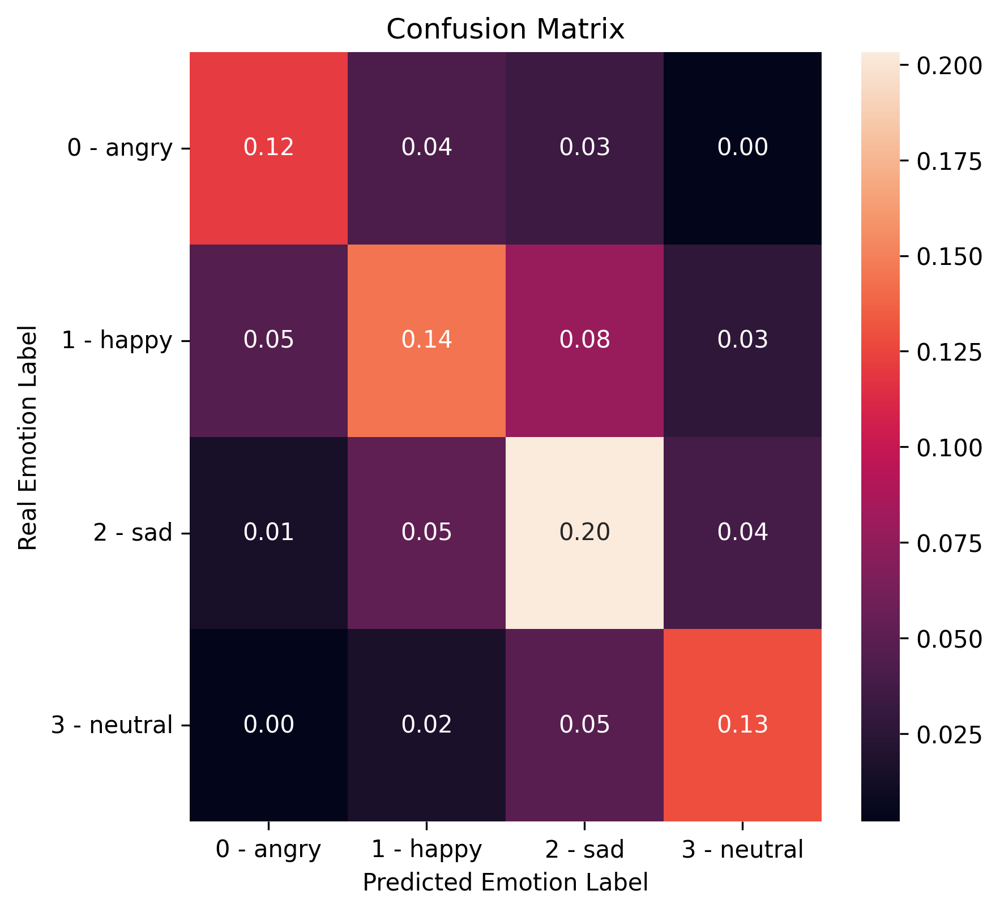

In [9]:
df = pd.read_csv(PREPROCESSED_EXTRACTED_FEATURES_FILE)
print(f"Number of Audio Files: {df.shape[0]}")
df = df.sort_values(['Emotion_Id', 'Gender'], ascending = (True, True))
df = df.set_index('File')
print(f"Number of Features: {len(df.iloc[:,9:].columns)}")
df = df[df['Emotion'].isin({'angry', 'neutral', 'sad', 'happy', 'excited'})]
df.loc[df['Emotion'] == 'excited', 'Emotion'] = 'happy'
df.loc[df['Emotion_Id'] == 5, 'Emotion_Id'] = 1
categorical_cross_validation(get_new_model)

Number of Audio Files: 5531
Number of Features: 327
Accuracy for fold 0: 62.42%
Accuracy for fold 1: 62.66%
Accuracy for fold 2: 62.48%
Accuracy for fold 3: 60.04%
Accuracy for fold 4: 59.67%

Metric             Value
-----------------  -----------
Accuracy           61.45+-1.31
F1 score macro     62.14
Precision          63.39
Recall             61.63
Matthews corrcoef  0.478
Training Time      50.56+-0.16
Prediction Time    5.01+-0.01

              precision    recall  f1-score   support

           0       0.72      0.60      0.65      1103
           1       0.59      0.52      0.56      1636
           2       0.66      0.66      0.66      1084
           3       0.56      0.68      0.61      1708

    accuracy                           0.61      5531
   macro avg       0.63      0.62      0.62      5531
weighted avg       0.62      0.61      0.61      5531



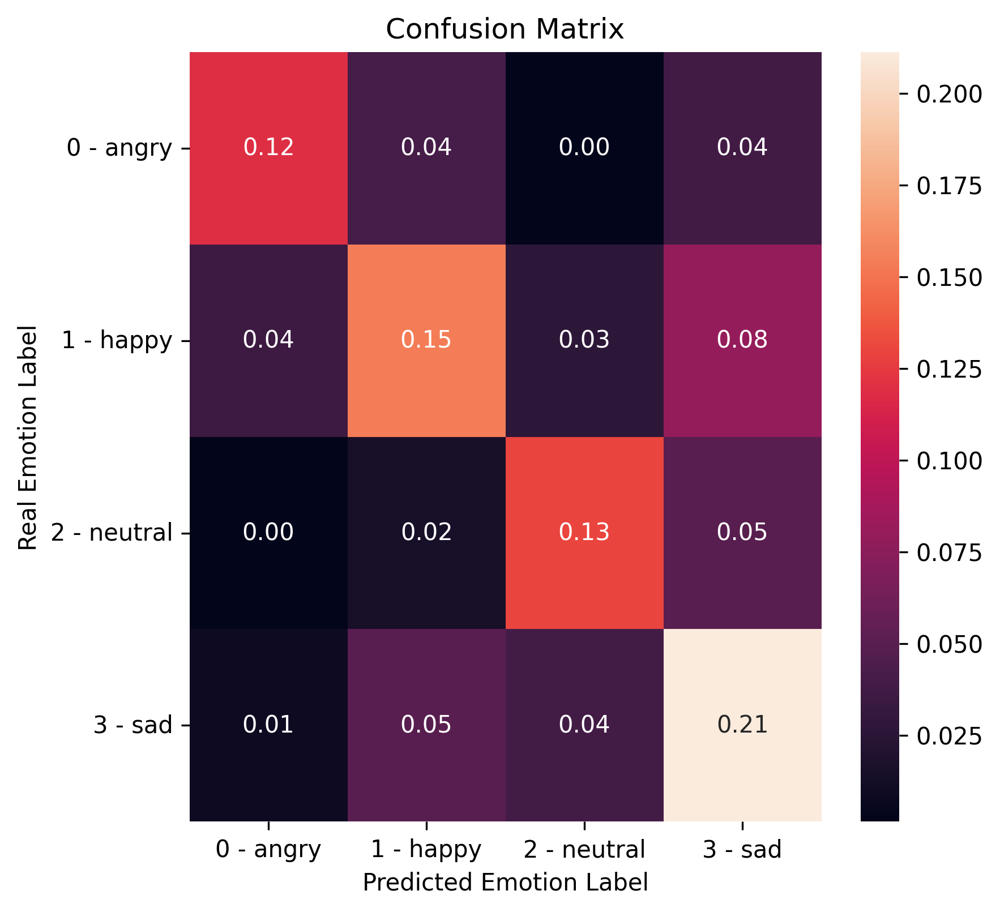

In [10]:
df = pd.read_csv(PREPROCESSED_ALL_EXTRACTED_FEATURES_FILE)
print(f"Number of Audio Files: {df.shape[0]}")
df = df.sort_values(['Emotion_Id', 'Gender'], ascending = (True, True))
df = df.set_index('File')
print(f"Number of Features: {len(df.iloc[:,8:].columns)}")
df = df[df['Emotion'].isin({'angry', 'neutral', 'sad', 'happy', 'excited'})]
df.loc[df['Emotion'] == 'excited', 'Emotion'] = 'happy'
df.loc[df['Emotion_Id'] == 5, 'Emotion_Id'] = 1
categorical_cross_validation(get_new_model)

In [9]:
df = pd.read_csv(PREPROCESSED_EXTRACTED_FEATURES_FILE)
print(f"Number of Audio Files: {df.shape[0]}")
df = df.sort_values(['Emotion_Id', 'Gender'], ascending = (True, True))
df = df.set_index('File')
print(f"Number of Features: {len(df.iloc[:,9:].columns)}")
df = df[df['Emotion'].isin({'angry', 'neutral', 'sad', 'happy', 'excited'})]
df.loc[df['Emotion'] == 'excited', 'Emotion'] = 'happy'
df.loc[df['Emotion_Id'] == 5, 'Emotion_Id'] = 1

Number of Audio Files: 5531
Number of Features: 33


Accuracy for fold 0: 53.66%
Accuracy for fold 1: 52.35%
Accuracy for fold 2: 52.35%
Accuracy for fold 3: 51.81%
Accuracy for fold 4: 54.34%

Metric             Value
-----------------  ----------
Accuracy           52.9+-0.94
F1 score macro     53.74
Precision          53.54
Recall             54.08
Matthews corrcoef  0.364
Training Time      0.04+-0.0
Prediction Time    0.01+-0.0

              precision    recall  f1-score   support

       angry       0.56      0.55      0.56      1103
       happy       0.50      0.45      0.48      1636
     neutral       0.50      0.51      0.50      1708
         sad       0.58      0.65      0.61      1084

    accuracy                           0.53      5531
   macro avg       0.54      0.54      0.54      5531
weighted avg       0.53      0.53      0.53      5531



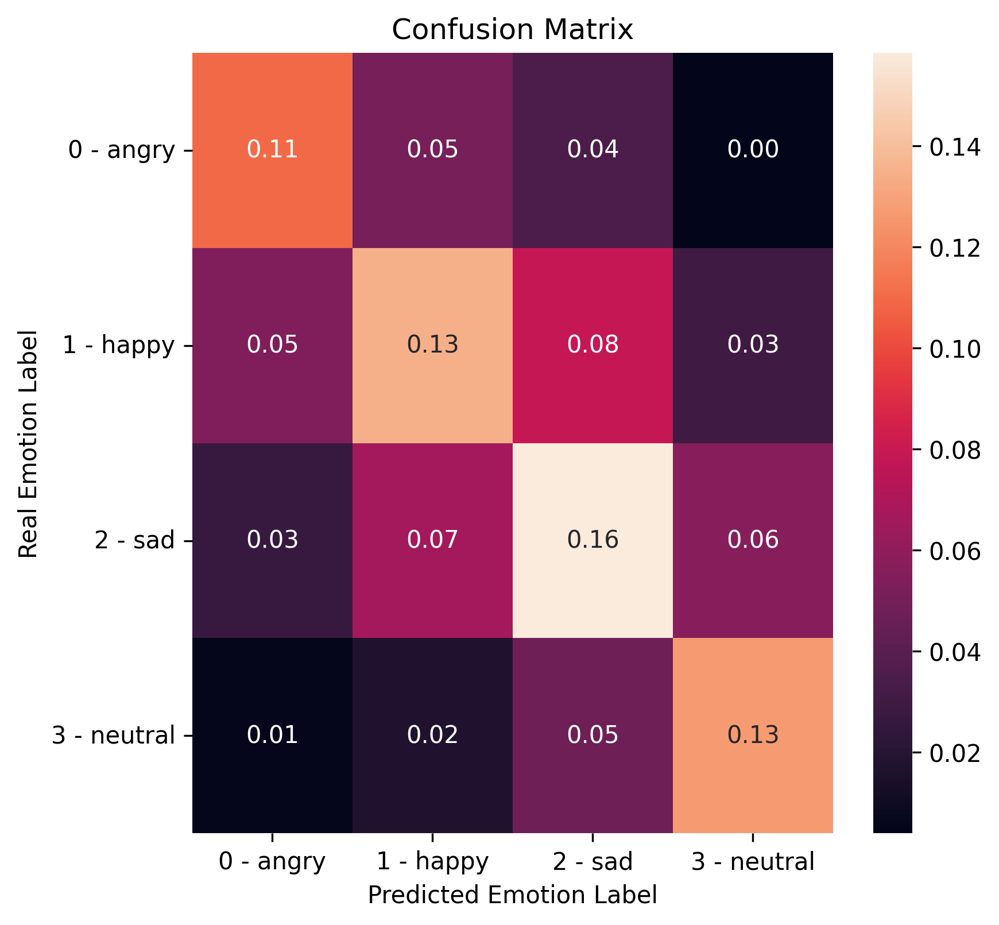

In [11]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import RidgeClassifier as Ridge
from imblearn.ensemble import BalancedRandomForestClassifier

def get_new_model():
    return Ridge(random_state=1)
categorical_cross_validation(get_new_model)

Accuracy for fold 0: 59.71%
Accuracy for fold 1: 59.22%
Accuracy for fold 2: 60.22%
Accuracy for fold 3: 59.67%
Accuracy for fold 4: 58.41%

Metric             Value
-----------------  -----------
Accuracy           59.45+-0.61
F1 score macro     60.07
Precision          60.56
Recall             59.83
Matthews corrcoef  0.45
Training Time      14.59+-0.23
Prediction Time    0.06+-0.0

              precision    recall  f1-score   support

       angry       0.64      0.57      0.61      1103
       happy       0.55      0.51      0.53      1636
     neutral       0.57      0.64      0.60      1708
         sad       0.66      0.67      0.66      1084

    accuracy                           0.59      5531
   macro avg       0.61      0.60      0.60      5531
weighted avg       0.60      0.59      0.59      5531



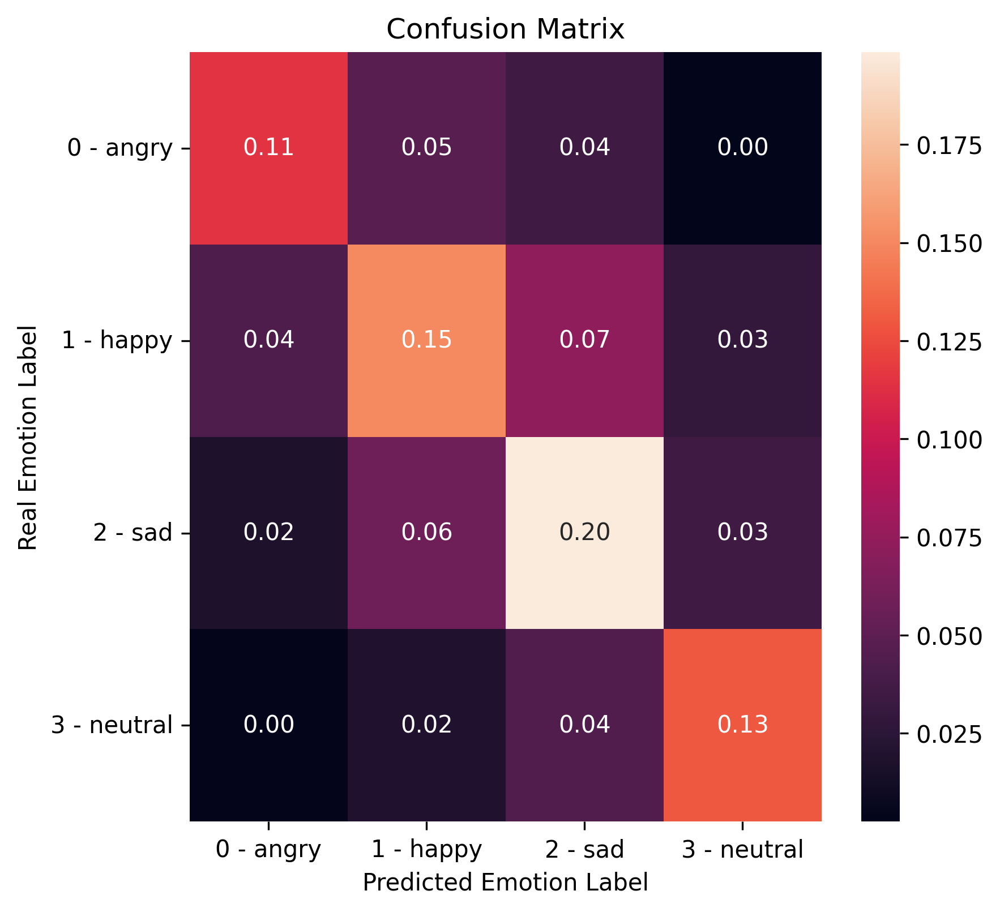

In [14]:
def get_new_model():
    return HistGradientBoostingClassifier(random_state=1)
categorical_cross_validation(get_new_model)

Accuracy for fold 0: 60.79%
Accuracy for fold 1: 60.22%
Accuracy for fold 2: 60.49%
Accuracy for fold 3: 59.31%
Accuracy for fold 4: 58.95%

Metric             Value
-----------------  ----------
Accuracy           59.95+-0.7
F1 score macro     60.58
Precision          61.18
Recall             60.39
Matthews corrcoef  0.458
Training Time      84.4+-0.32
Prediction Time    0.61+-0.01

              precision    recall  f1-score   support

       angry       0.66      0.60      0.63      1103
       happy       0.57      0.49      0.53      1636
     neutral       0.56      0.66      0.61      1708
         sad       0.66      0.66      0.66      1084

    accuracy                           0.60      5531
   macro avg       0.61      0.60      0.61      5531
weighted avg       0.60      0.60      0.60      5531



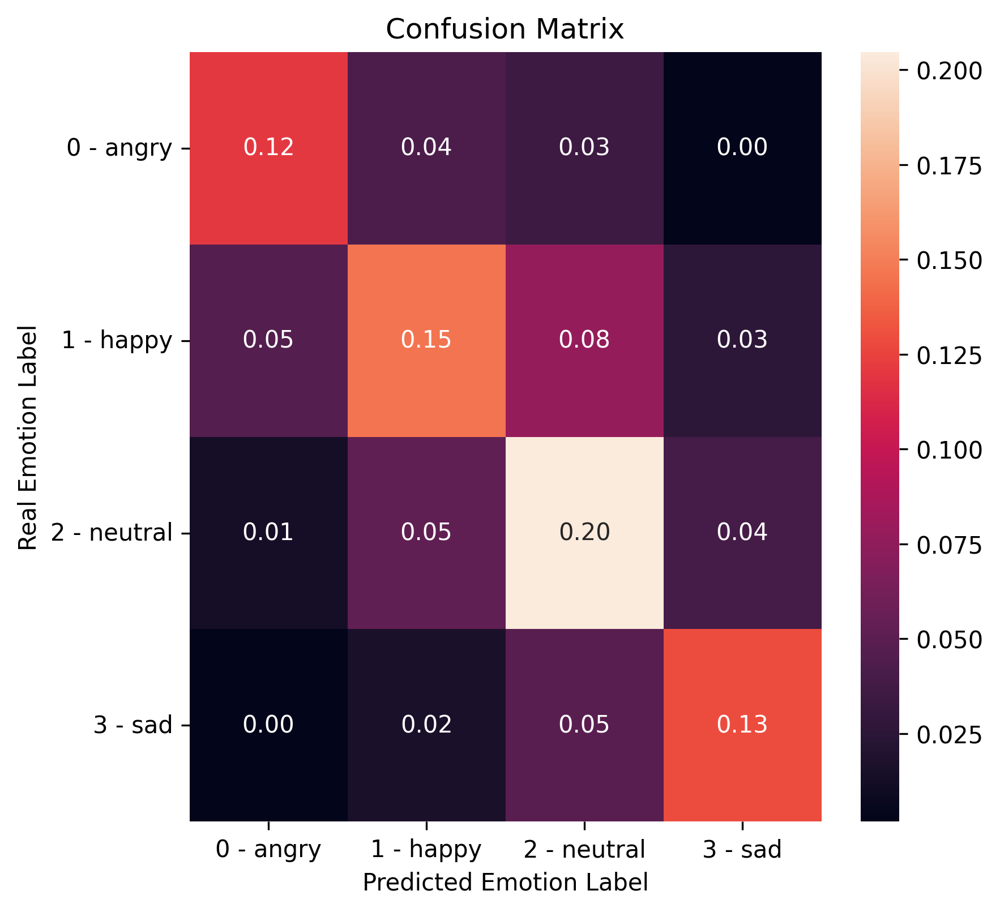

In [11]:
def get_new_model():
    return AdaBoostClassifier(random_state=1, estimator=RandomForest(bootstrap=False, max_features=6, min_samples_leaf=2,
                       min_samples_split=3, n_estimators=512, n_jobs=1,
                       random_state=1, warm_start=False))
categorical_cross_validation(get_new_model)


Accuracy for fold 0: 60.61%
Accuracy for fold 1: 61.3%
Accuracy for fold 2: 59.67%
Accuracy for fold 3: 59.58%
Accuracy for fold 4: 57.87%

Metric             Value
-----------------  -----------
Accuracy           59.81+-1.16
F1 score macro     60.46
Precision          60.94
Recall             60.36
Matthews corrcoef  0.456
Training Time      32.86+-0.16
Prediction Time    1.62+-0.01

              precision    recall  f1-score   support

       angry       0.66      0.60      0.63      1103
       happy       0.56      0.49      0.52      1636
     neutral       0.56      0.66      0.60      1708
         sad       0.66      0.66      0.66      1084

    accuracy                           0.60      5531
   macro avg       0.61      0.60      0.60      5531
weighted avg       0.60      0.60      0.60      5531



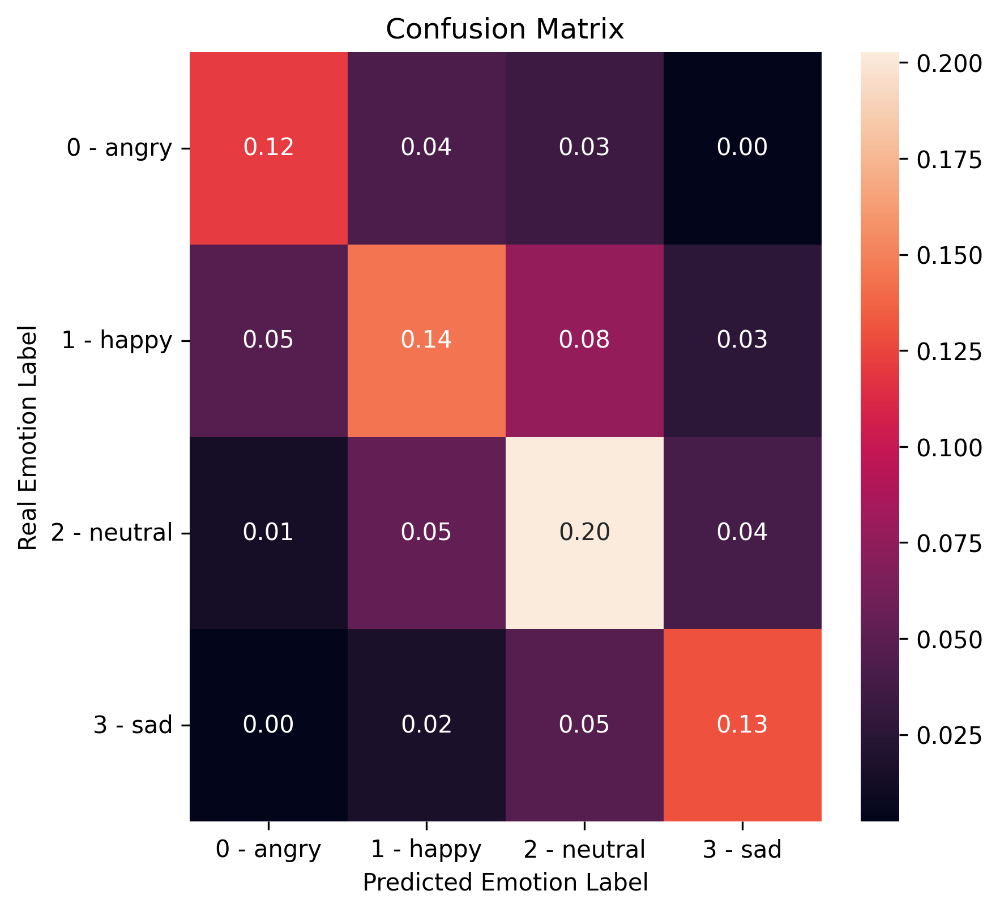

In [14]:
def get_new_model():
    return AdaBoostClassifier(random_state=1, estimator=RandomForest(n_estimators=2000, n_jobs=-1, random_state=1))
categorical_cross_validation(get_new_model)


Accuracy for fold 0: 60.16%
Accuracy for fold 1: 61.75%
Accuracy for fold 2: 59.76%
Accuracy for fold 3: 59.67%
Accuracy for fold 4: 58.86%

Metric             Value
-----------------  -----------
Accuracy           60.04+-0.95
F1 score macro     60.76
Precision          61.29
Recall             60.59
Matthews corrcoef  0.459
Training Time      8.65+-0.03
Prediction Time    0.41+-0.0

              precision    recall  f1-score   support

       angry       0.67      0.61      0.63      1103
       happy       0.57      0.50      0.53      1636
     neutral       0.56      0.66      0.60      1708
         sad       0.66      0.67      0.66      1084

    accuracy                           0.60      5531
   macro avg       0.61      0.61      0.61      5531
weighted avg       0.60      0.60      0.60      5531



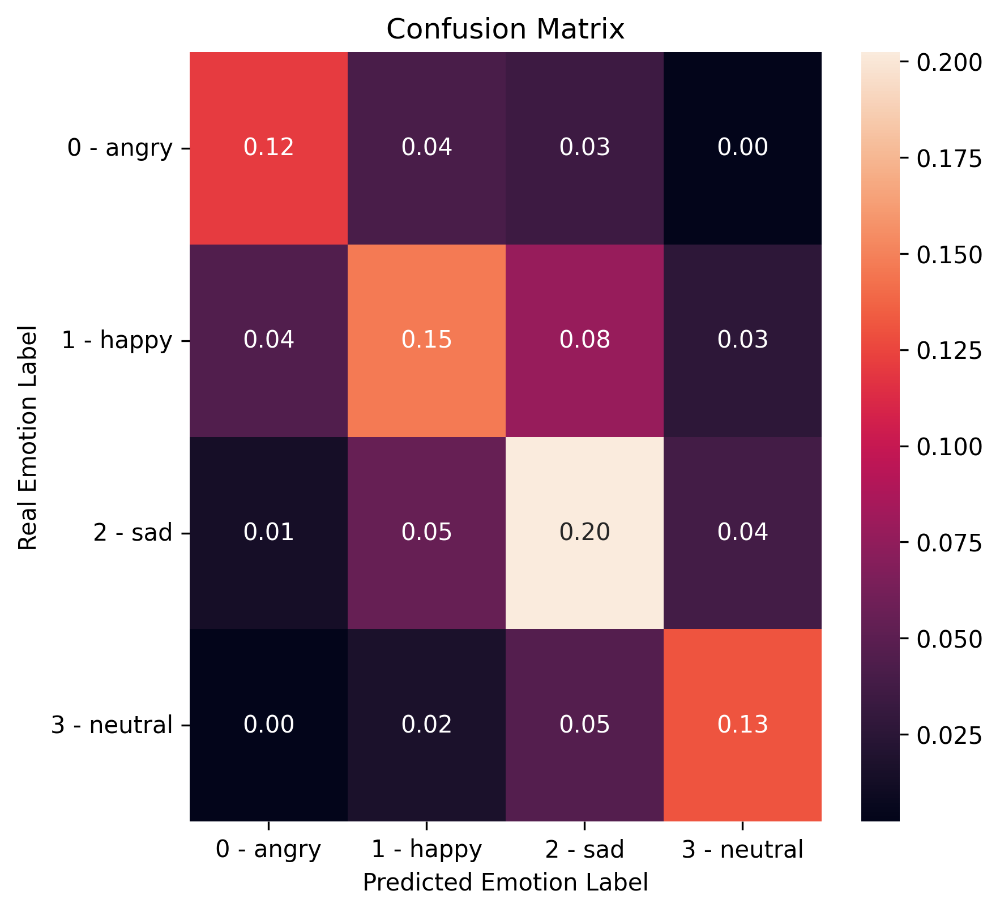

In [12]:
def get_new_model():
    return AdaBoostClassifier(random_state=1, estimator=RandomForest(n_estimators=512, n_jobs=-1, random_state=1))
categorical_cross_validation(get_new_model)

Accuracy for fold 0: 55.19%
Accuracy for fold 1: 53.98%
Accuracy for fold 2: 52.53%
Accuracy for fold 3: 53.44%
Accuracy for fold 4: 53.25%

Metric             Value
-----------------  -----------
Accuracy           53.68+-0.89
F1 score macro     54.72
Precision          54.64
Recall             54.96
Matthews corrcoef  0.374
Training Time      0.09+-0.0
Prediction Time    0.01+-0.0

              precision    recall  f1-score   support

       angry       0.61      0.56      0.58      1103
       happy       0.49      0.47      0.48      1636
     neutral       0.50      0.51      0.51      1708
         sad       0.59      0.66      0.62      1084

    accuracy                           0.54      5531
   macro avg       0.55      0.55      0.55      5531
weighted avg       0.54      0.54      0.54      5531



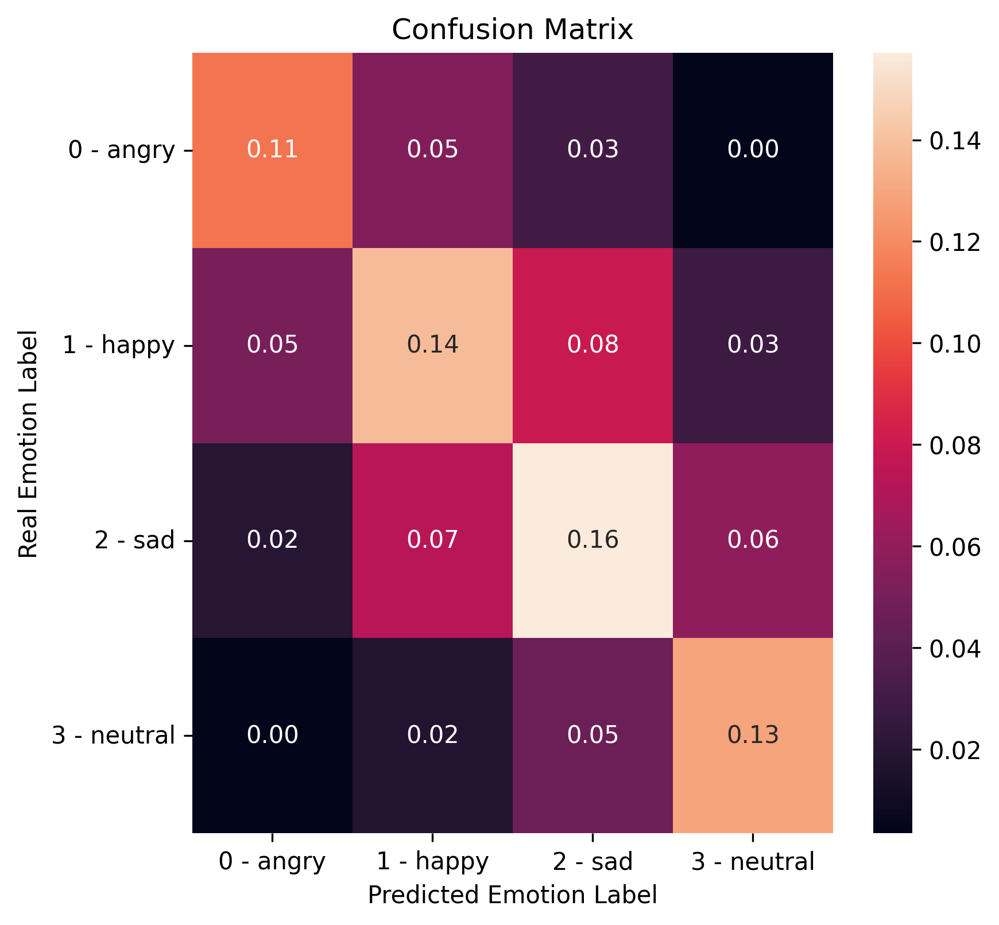

In [13]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def get_new_model():
    return LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr',
                           tol=0.00010000000000000009)
categorical_cross_validation(get_new_model)